In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import lstsq
from approximate_functions_and_plot import *
from scipy.integrate import solve_ivp
import matplotlib.gridspec as gridspec

# from utils import *
from scipy.linalg import eig
x0=np.loadtxt('./nonlinear_vectorfield_data_x0.txt')
x1=np.loadtxt('./nonlinear_vectorfield_data_x1.txt')

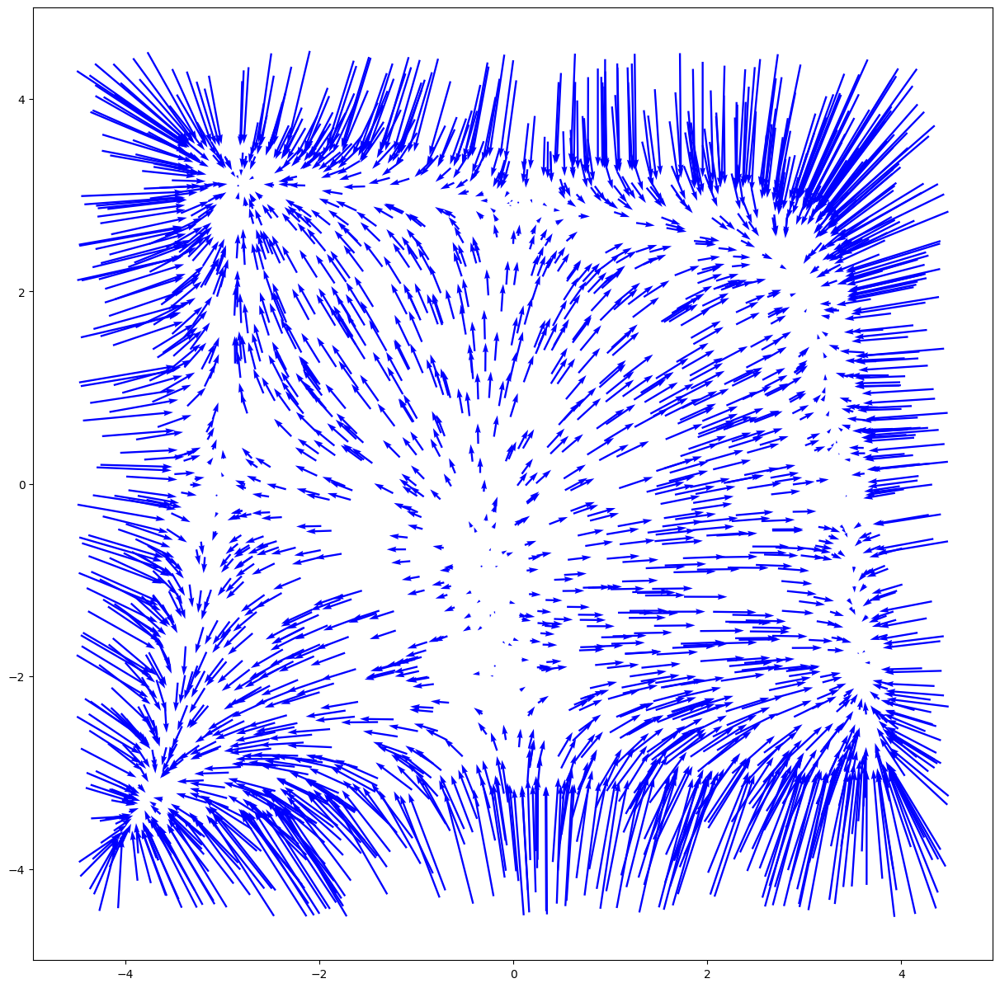

In [3]:
# plot_x0_to_x1 to get a general idea
def plot_x0_to_x1(x0,x1):
    x0x = x0[:, 0].T
    x0y = x0[:, 1].T
    x1x = x1[:, 0].T
    x1y = x1[:, 1].T
    fig = plt.figure(figsize=(15,15))
    plt.quiver(x0x,x0y,x1x-x0x,x1y-x0y, scale=4, color='blue', width=0.002)

    plt.show()
plot_x0_to_x1(x0,x1)


In [4]:
# use linear system to fit and get A matrix

delta_t = 0.01
v_k = (x1 - x0) / delta_t
X = np.hstack([x0, np.ones((x0.shape[0], 1))])

# Solve for A using the normal equation: (X^T X)^(-1) X^T v
A_estimated = np.linalg.pinv(X.T @ X) @ X.T @ v_k
# Extract the 2x2 matrix part of A (excluding the intercept)
A_matrix = A_estimated[:-1, :].T

A_matrix








array([[-1.00061009, -0.02703414],
       [ 0.0968975 , -4.34400169]])

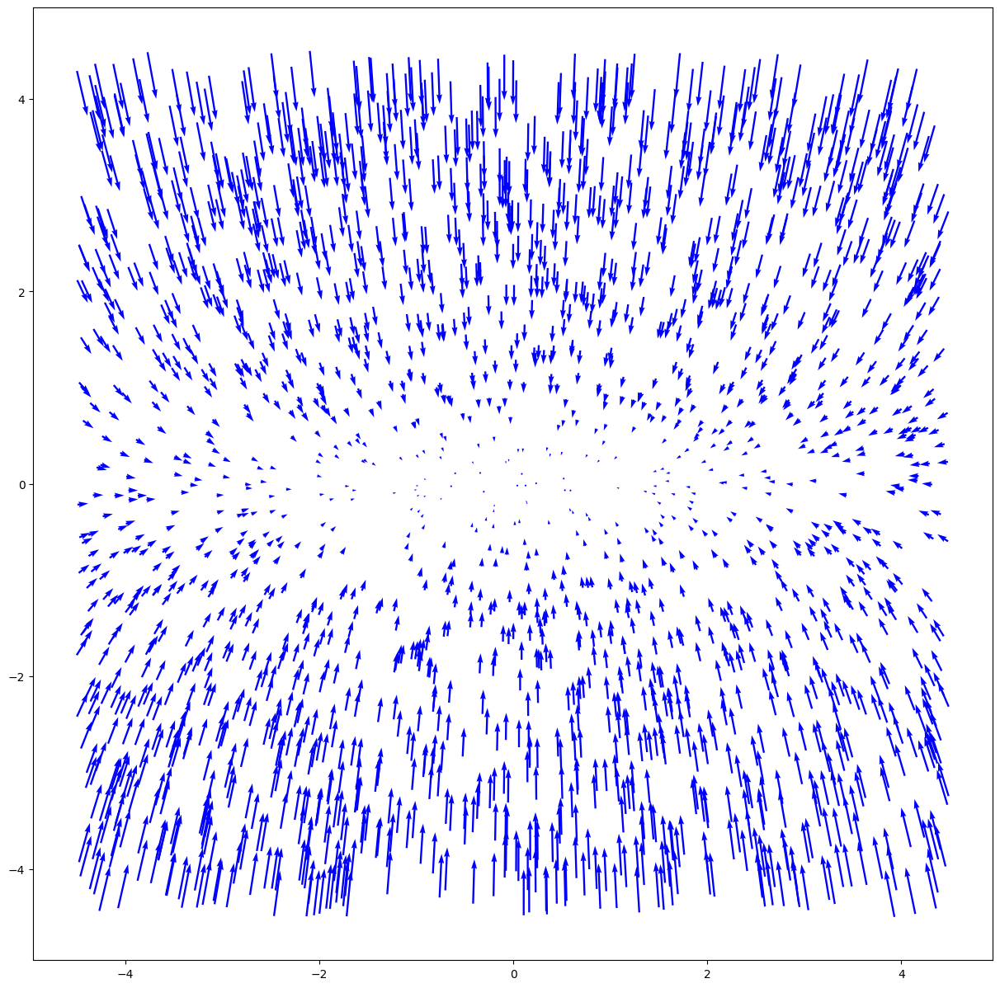

0.01863701126916985

In [5]:
# use linear system to fit and get it MSE

# Function to describe the system of differential equations (dot{x} = Ax)
def system(t, x, A):
    return A @ x

# Time points (start at 0, end at delta_t)
t_span = (0, delta_t)
t_eval = np.linspace(t_span[0], t_span[1], 2) # Evaluating at start and end time

# Solve the differential equation for each initial point x0(k)
x1_estimates = []
for x0_k in x0:
    sol = solve_ivp(system, t_span, x0_k, args=(A_matrix,), t_eval=t_eval, method='RK45')
    x1_estimates.append(sol.y[:, -1]) # Take the solution at the end time

# Convert the list of x1 estimates to a NumPy array
    
x1_estimates = np.array(x1_estimates)
#plot_x0_to_x1 to get the idea that the linear system is not suitable for the dataset
plot_x0_to_x1(x0,x1_estimates)

# Calculate the Mean Squared Error (MSE) with the known x1 points
mse = np.mean((x1_estimates - x1)**2)

mse


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(60, 60)


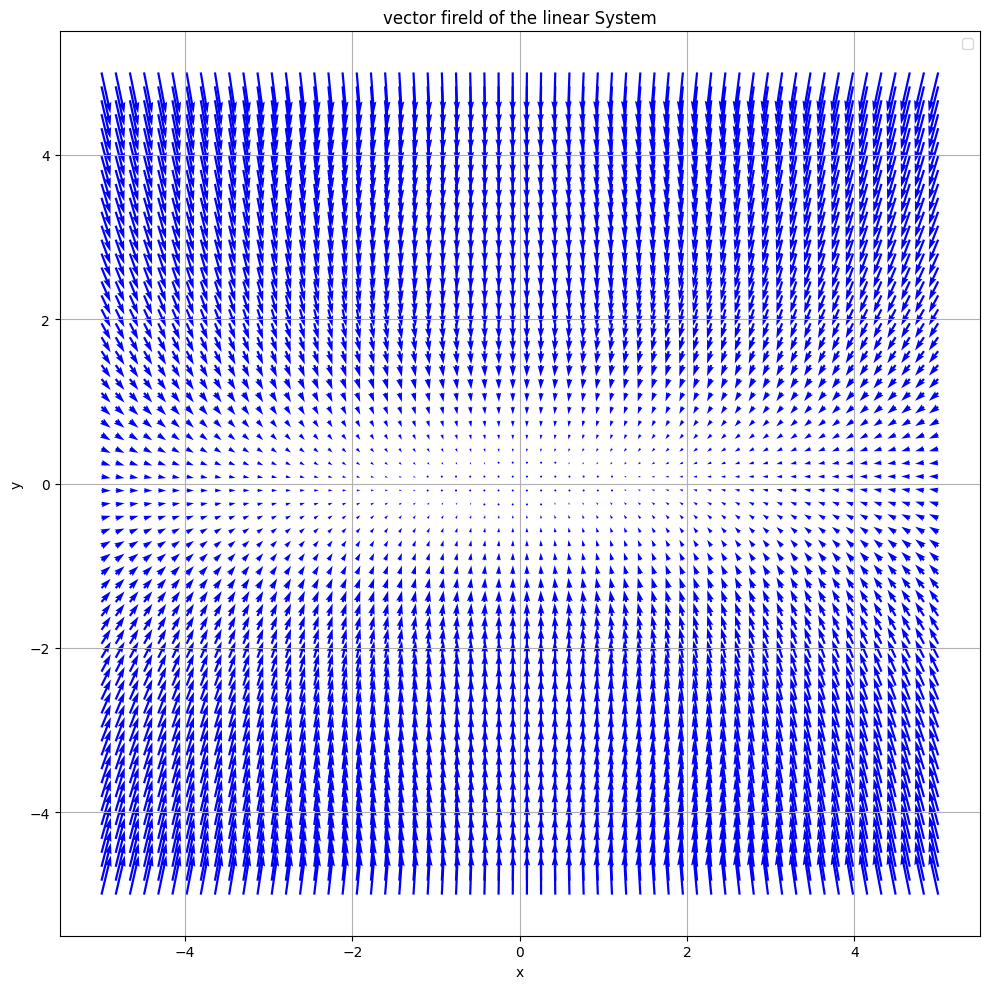

<Axes: title={'center': 'phase portrait of the linear System'}>

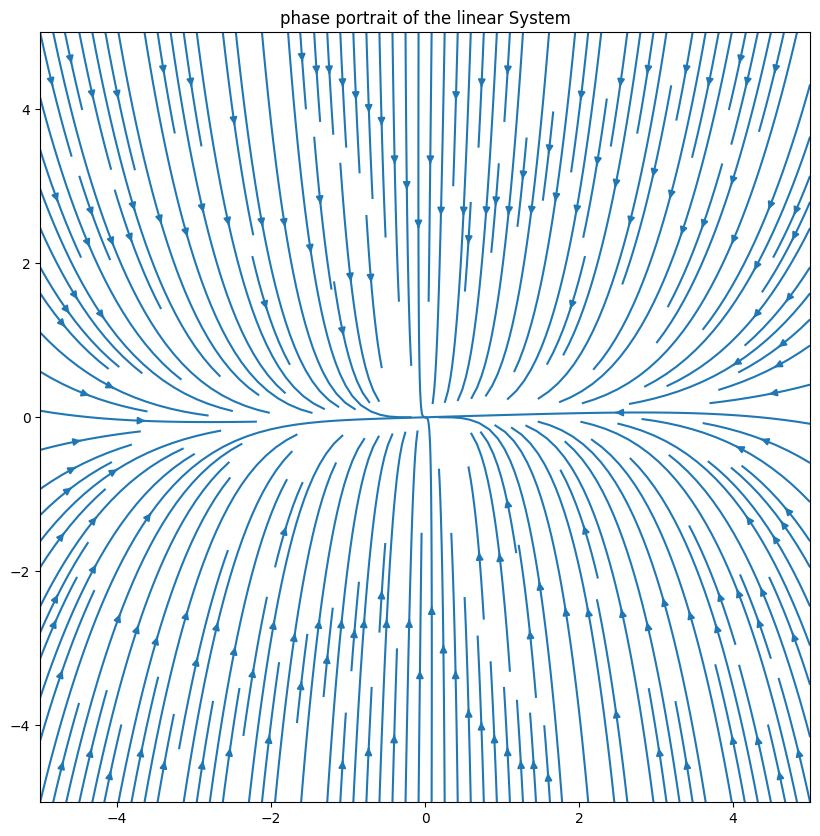

In [6]:
# vector field for linear system

plt.figure(figsize=(10, 10))

# Trajectory plot
X, Y = np.meshgrid(np.linspace(-5, 5, 60), np.linspace(-5, 5, 60))
print(X.shape)
U, V = A_matrix @ np.array([X.ravel(), Y.ravel()]).reshape(2, -1)

plt.quiver(X, Y, U, V, color='blue',scale=500)
# plt.scatter(10, 10, color='red', label='Initial Point (10, 10)')
plt.title('vector fireld of the linear System')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)



plt.tight_layout()
plt.show()
plot_phase_portrait(U.reshape(60,60), V.reshape(60,60),5, 'phase portrait of the linear System')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


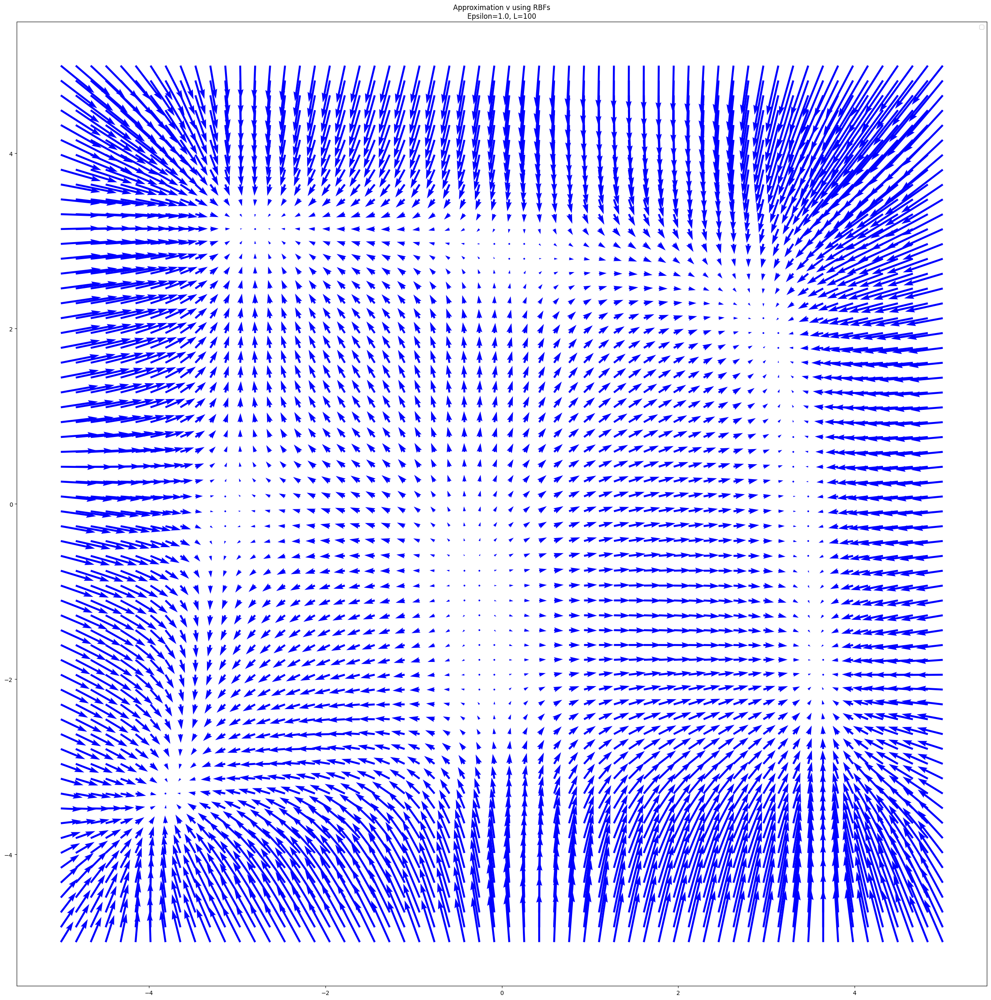

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


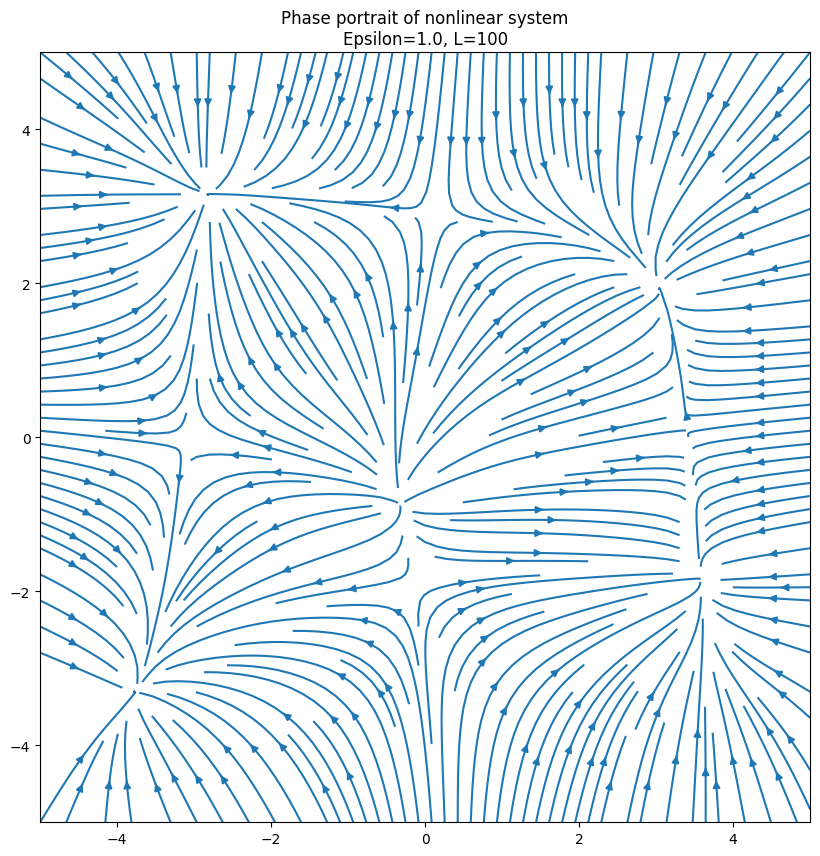

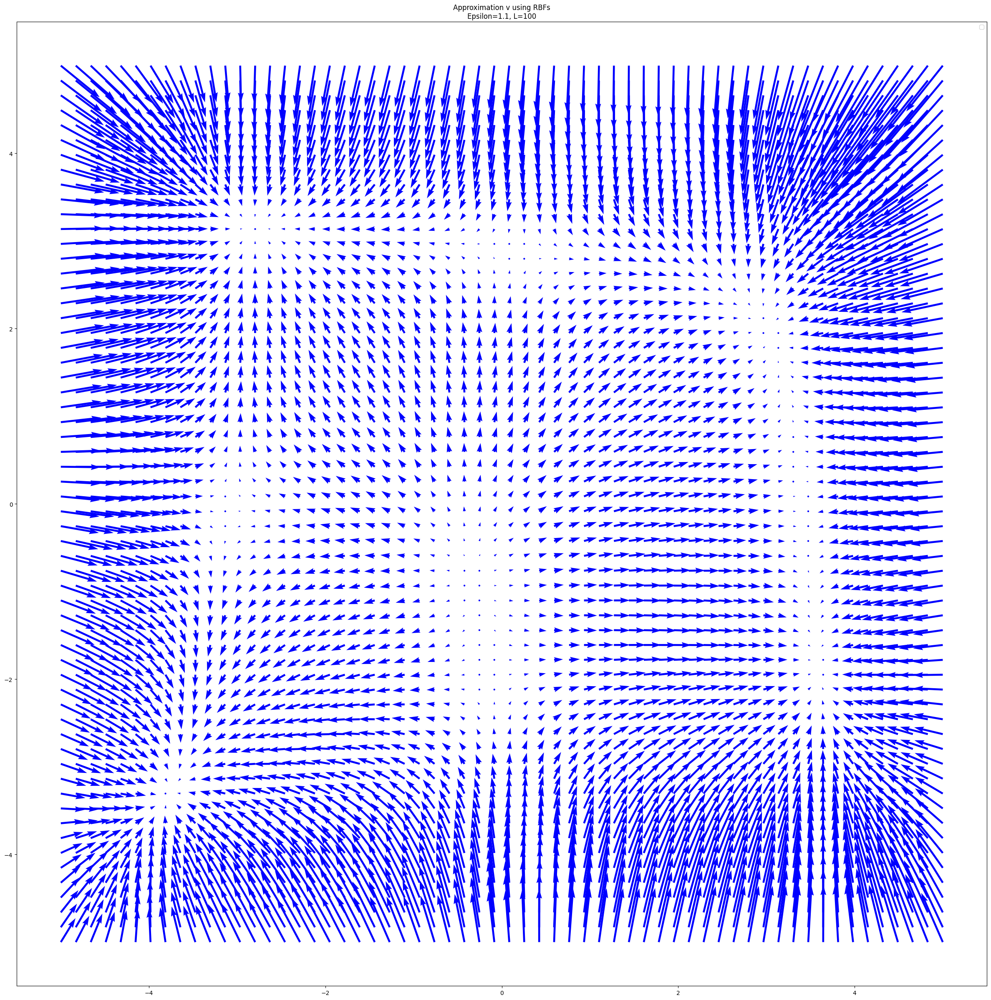

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


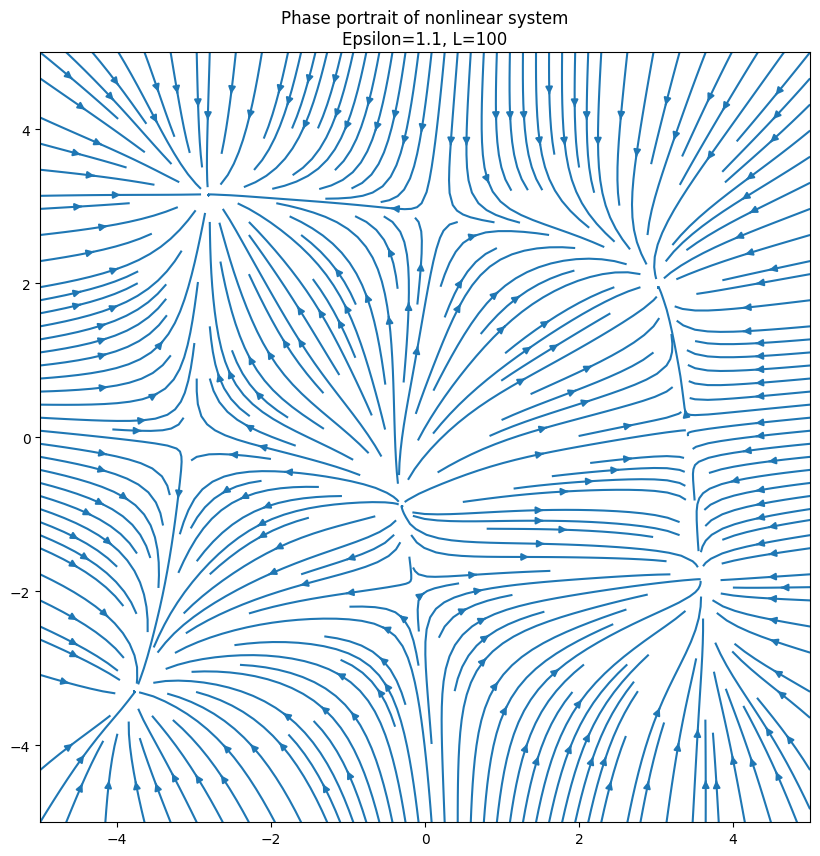

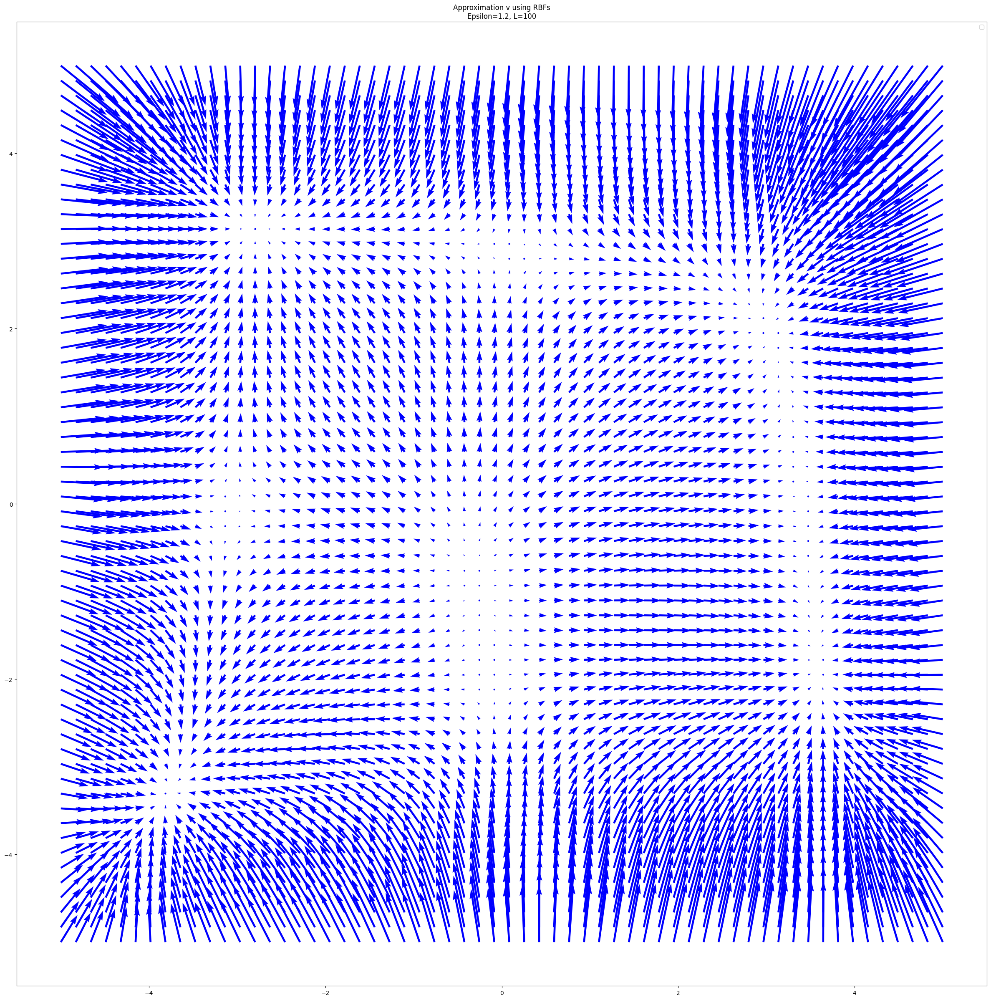

KeyboardInterrupt: 

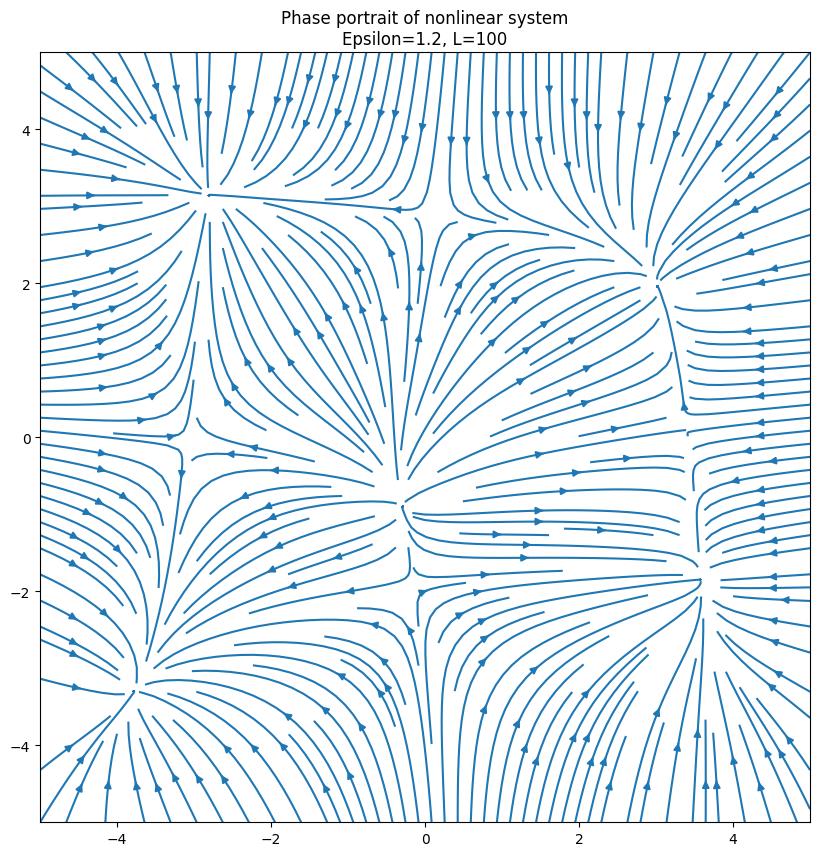

<Figure size 3000x3000 with 0 Axes>

In [7]:
# MSE for diffent l and epsilon for RBF

def mse_for_rbf(l,e):
  # create grid for centers of RBFs
  center_grid = np.meshgrid(*[np.linspace(np.min(x0[:, i]), np.max(x0[:, i]), l) for i in range(x0.shape[1])])
  centers = np.column_stack([grid.flatten() for grid in center_grid])

  coe,res = ls_rbf(x0, v_k, centers, e)
  plot_rbf(centers, e,coe)

  v_approximated = radial_basis_function_with_coe(x0, coe, centers, e)
  mse = np.mean((v_approximated*0.01+x0 - x1)**2)
  return mse,coe


dic_mse={}
for l in [10,100]:
  for e in np.arange(1,4,0.1):
    e=np.round(e,1)
    dic_mse[f'MSE when l={l},epsilon={e}']=mse_for_rbf(l,e)[0]

# print(dic_mse)

In [ ]:
print(dic_mse)
# {'MSE when l=10,epsilon=1.0': 4.475698200376553e-05, 'MSE when l=10,epsilon=1.1': 2.6839718390368526e-05, 'MSE when l=10,epsilon=1.2': 1.496209583881946e-05, 'MSE when l=10,epsilon=1.3': 7.91534795366888e-06, 'MSE when l=10,epsilon=1.4': 4.041378164726004e-06, 'MSE when l=10,epsilon=1.5': 2.018355677725492e-06, 'MSE when l=10,epsilon=1.6': 9.963068016768415e-07, 'MSE when l=10,epsilon=1.7': 4.899333965446109e-07, 'MSE when l=10,epsilon=1.8': 2.4141588175563496e-07, 'MSE when l=10,epsilon=1.9': 1.1970786527175823e-07, 'MSE when l=10,epsilon=2.0': 5.991288718501519e-08, 'MSE when l=10,epsilon=2.1': 3.033001365823607e-08, 'MSE when l=10,epsilon=2.2': 1.555250075260338e-08, 'MSE when l=10,epsilon=2.3': 8.085615620700455e-09, 'MSE when l=10,epsilon=2.4': 4.264591220844954e-09, 'MSE when l=10,epsilon=2.5': 2.282831740357766e-09, 'MSE when l=10,epsilon=2.6': 1.2406273908961245e-09, 'MSE when l=10,epsilon=2.7': 6.868745438706218e-10, 'MSE when l=10,epsilon=2.8': 4.406715725990759e-10, 'MSE when l=10,epsilon=2.9': 2.348915391866774e-10, 'MSE when l=10,epsilon=3.0': 1.2807811829140223e-10, 'MSE when l=10,epsilon=3.1': 8.685955460426448e-11, 'MSE when l=10,epsilon=3.2': 4.878400848125921e-11, 'MSE when l=10,epsilon=3.3': 2.8461786735003303e-11, 'MSE when l=10,epsilon=3.4': 1.9030470416637405e-11, 'MSE when l=10,epsilon=3.5': 1.2971048147770878e-11, 'MSE when l=10,epsilon=3.6': 8.072523646869639e-12, 'MSE when l=10,epsilon=3.7': 5.7076710968625535e-12, 'MSE when l=10,epsilon=3.8': 4.265117644667271e-12, 'MSE when l=10,epsilon=3.9': 3.3666851430128923e-12, 'MSE when l=100,epsilon=1.0': 4.925098020037424e-16, 'MSE when l=100,epsilon=1.1': 1.751229742263636e-16, 'MSE when l=100,epsilon=1.2': 1.8370764926293325e-16, 'MSE when l=100,epsilon=1.3': 6.021655411848928e-16, 'MSE when l=100,epsilon=1.4': 3.9550429857679556e-16, 'MSE when l=100,epsilon=1.5': 5.405145584760749e-16, 'MSE when l=100,epsilon=1.6': 2.0931063430650832e-15, 'MSE when l=100,epsilon=1.7': 7.653243802641737e-16, 'MSE when l=100,epsilon=1.8': 1.887604238200384e-15, 'MSE when l=100,epsilon=1.9': 2.4465293453287454e-16, 'MSE when l=100,epsilon=2.0': 1.17159575555681e-15, 'MSE when l=100,epsilon=2.1': 6.526631631480392e-16, 'MSE when l=100,epsilon=2.2': 7.0566843993383186e-15, 'MSE when l=100,epsilon=2.3': 1.1604304252084657e-15, 'MSE when l=100,epsilon=2.4': 1.5428268345152381e-15, 'MSE when l=100,epsilon=2.5': 1.0816094216060403e-15, 'MSE when l=100,epsilon=2.6': 1.853237579484085e-15, 'MSE when l=100,epsilon=2.7': 3.175526847731869e-15, 'MSE when l=100,epsilon=2.8': 1.2624864573863068e-14, 'MSE when l=100,epsilon=2.9': 1.2579241053782862e-14, 'MSE when l=100,epsilon=3.0': 2.416773686934591e-15, 'MSE when l=100,epsilon=3.1': 7.872497945317132e-16, 'MSE when l=100,epsilon=3.2': 1.6672830840520858e-15, 'MSE when l=100,epsilon=3.3': 1.1278996107971974e-14, 'MSE when l=100,epsilon=3.4': 1.9493059435680885e-14, 'MSE when l=100,epsilon=3.5': 4.590982851999926e-15, 'MSE when l=100,epsilon=3.6': 2.7811899761314027e-14, 'MSE when l=100,epsilon=3.7': 9.51044938390382e-15, 'MSE when l=100,epsilon=3.8': 1.5835688570499586e-14, 'MSE when l=100,epsilon=3.9': 1.3016622173270882e-14}

{'MSE when l=10,epsilon=1.0': 4.475698200376553e-05, 'MSE when l=10,epsilon=1.1': 2.6839718390368526e-05, 'MSE when l=10,epsilon=1.2': 1.496209583881946e-05, 'MSE when l=10,epsilon=1.3': 7.91534795366888e-06, 'MSE when l=10,epsilon=1.4': 4.041378164726004e-06, 'MSE when l=10,epsilon=1.5': 2.018355677725492e-06, 'MSE when l=10,epsilon=1.6': 9.963068016768415e-07, 'MSE when l=10,epsilon=1.7': 4.899333965446109e-07, 'MSE when l=10,epsilon=1.8': 2.4141588175563496e-07, 'MSE when l=10,epsilon=1.9': 1.1970786527175823e-07, 'MSE when l=10,epsilon=2.0': 5.991288718501519e-08, 'MSE when l=10,epsilon=2.1': 3.033001365823607e-08, 'MSE when l=10,epsilon=2.2': 1.555250075260338e-08, 'MSE when l=10,epsilon=2.3': 8.085615620700455e-09, 'MSE when l=10,epsilon=2.4': 4.264591220844954e-09, 'MSE when l=10,epsilon=2.5': 2.282831740357766e-09, 'MSE when l=10,epsilon=2.6': 1.2406273908961245e-09, 'MSE when l=10,epsilon=2.7': 6.868745438706218e-10, 'MSE when l=10,epsilon=2.8': 4.406715725990759e-10, 'MSE whe

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


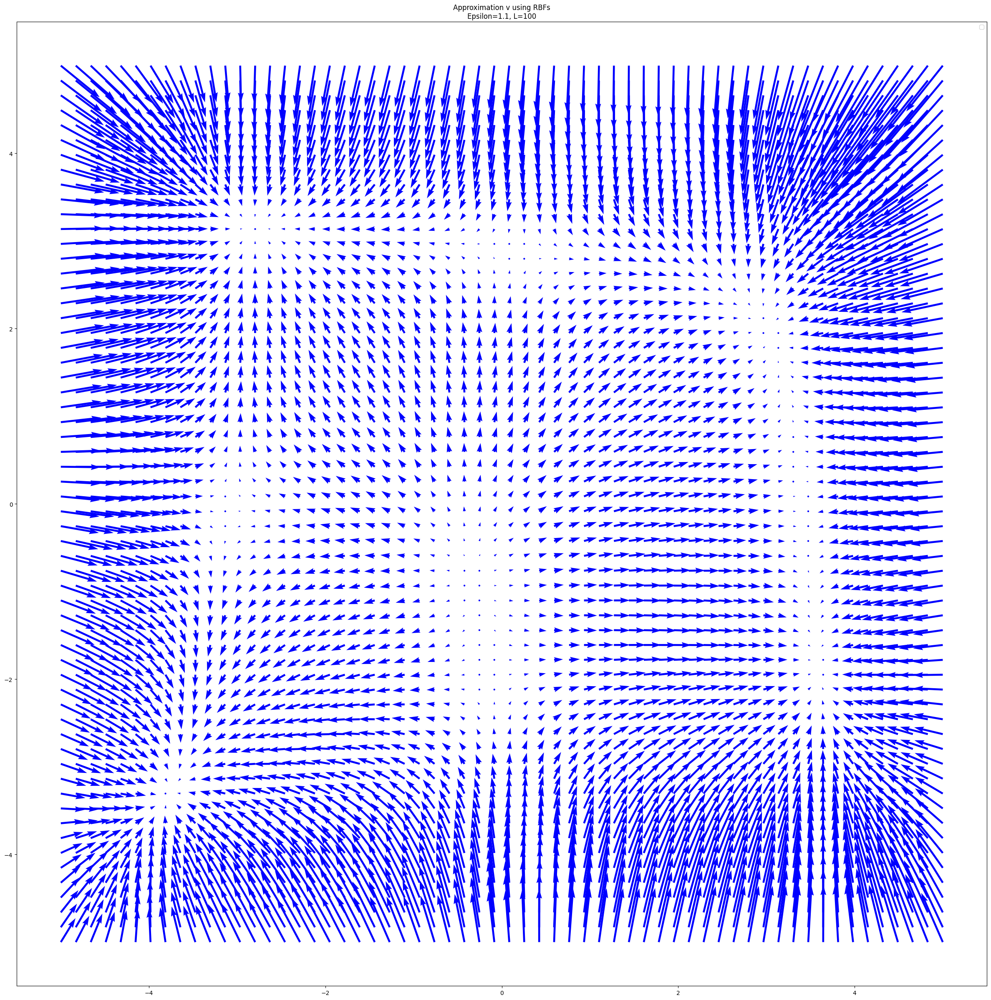

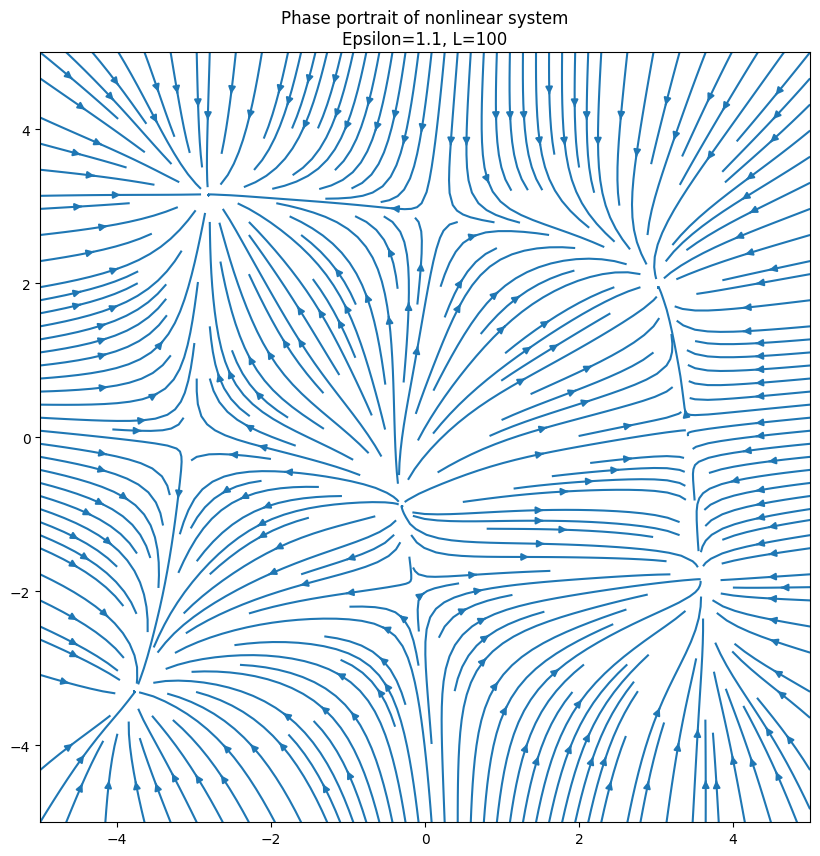

In [8]:
# get coefficient for the chosen parameter

l=10 
e = 1.1

center_grid = np.meshgrid(*[np.linspace(np.min(x0[:, i]), np.max(x0[:, i]), l) for i in range(x0.shape[1])])
centers = np.column_stack([grid.flatten() for grid in center_grid])
coe,res = ls_rbf(x0, v_k, centers, e)
plot_rbf(centers, e,coe)


sample number: 1
ending point: -2.9390747372881827 3.302750187874586
sample number: 2
ending point: -3.8459051227657244 -3.46466549405077
sample number: 3
ending point: -3.844753402001147 -3.4653316754039234
sample number: 4
ending point: -3.8457988907290055 -3.4647400361050003
sample number: 5
ending point: -2.9391249689398378 3.302389113593872
sample number: 6
ending point: -2.9391617132859986 3.302135773878698
sample number: 7
ending point: -2.938874034492369 3.304281794126378
sample number: 8
ending point: -2.939102239756316 3.3025070079290617
sample number: 9
ending point: -2.939101348580592 3.3025010217387734
sample number: 10
ending point: -3.8455512207043303 -3.4648907847367667
sample number: 11
ending point: 3.189905312801976 1.970955240106427
sample number: 12
ending point: -2.939031020234455 3.303107808799893
sample number: 13
ending point: 3.1909396467426085 1.9716548405366254
sample number: 14
ending point: -3.843877975904873 -3.4657565406457995
sample number: 15
ending po

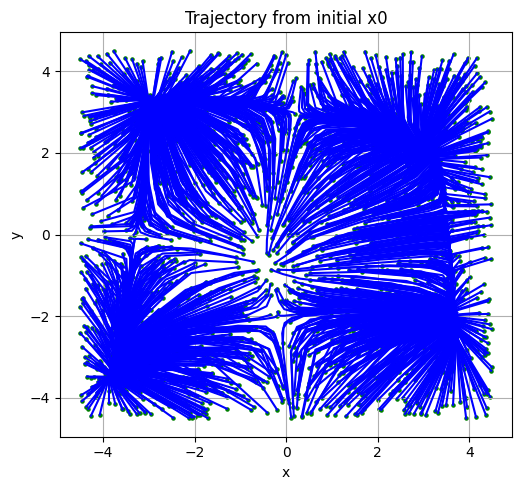

In [10]:

# plot trajectory from x0
t_span_extended = (0, 10)
t_eval_extended = np.linspace(t_span_extended[0], t_span_extended[1], 100)
epsilon = 1


# build function to fit the input of sol_ivp
def fun(t, y):
    return radial_basis_function_with_coe(y, coe, centers, epsilon)

plt.figure(figsize=(10, 5))

# add a counter to know how many sample have been plot
i=0
for ini in x0:
    i+=1
    print('sample number:',i)
    # solve with solve_ivp
    sol_extended = solve_ivp(fun, t_span_extended, ini, t_eval=t_eval_extended ,method='RK45')
    print('ending point:',sol_extended['y'][:,-1][0],sol_extended['y'][:,-1][1])
    # Trajectory plot
    plt.subplot(1, 2, 1)
    plt.plot(sol_extended.y[0], sol_extended.y[1], label='Trajectory',color='b')

    
    # plot start and final point
    plt.scatter(ini[0],ini[1], color='g', label='Initial Point',s=5)
    plt.scatter(sol_extended['y'][:,-1][0],sol_extended['y'][:,-1][1], color='r', label='Final Point',s=5)
    

plt.title('Trajectory from initial x0')
plt.xlabel('x')
plt.ylabel('y')
plt.grid(True)
plt.tight_layout()
plt.show()
